# Week 2: Adam

## Review from last week

Last week we learned how to use Auto Differentiation (AD) to efficiently calculate the partial derivatives for a function with respect to its parameters. For us, the function we are often interested in is some sort of objective function. 

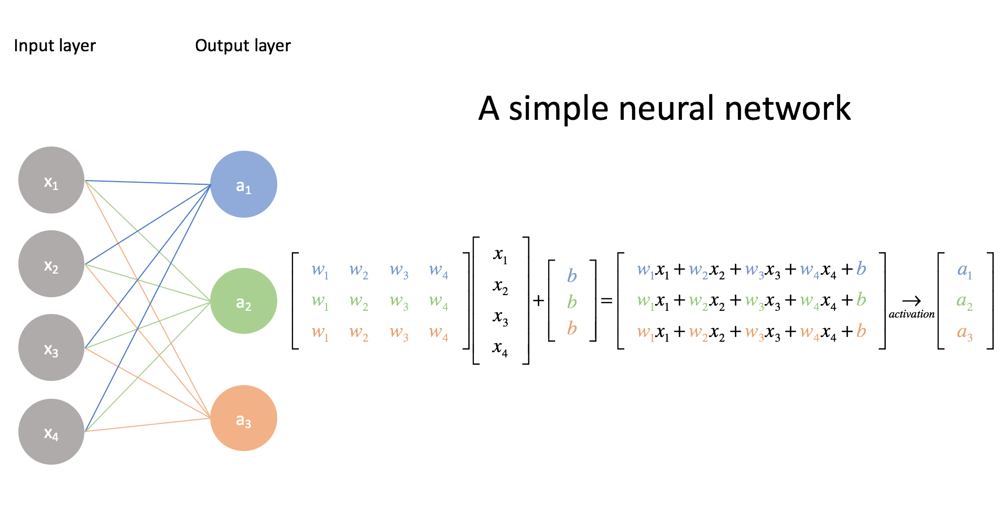
Source: https://www.jeremyjordan.me/intro-to-neural-networks/

## What do we do with all of these partial derivatives?

We use them for gradient descent of course! In many machine learning applications we need to optimize some objective function with respect to its parameters. Gradient decent is a technique that allows us to make incremental improvements to these parameters by calculating the gradient with respect to a particular parameter and adjusting the parameter accordingly. This allows us to takes steps "down" the error surface to an optima.

---

# General Form

All of the variations of gradient descent follow a general form for updating the parameters $\theta$ that we are optimizing at time step $t$ with learning rate $\alpha$ and with $G$ representing some manipulation of the gradient. 

$$ \theta_{t} = \theta_{t-1} - \alpha G_{t-1} \tag{1}$$ 
---

# 2.1 Vanilla Gradient Descent

In Vanilla gradient descent $G$ is the gradient. Therefore the update rule is as follows:

$$ \theta_{t} = \theta_{t-1} - \alpha \nabla f(\theta_{t-1}) \tag{2}$$
---

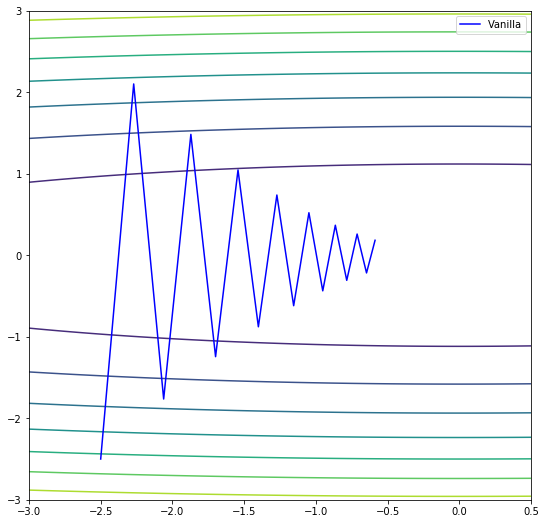

In [19]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['figure.figsize'] = (9,9)

np.random.seed(0)

# Specify a function to optimize.
# In a regular machine learning application this 
# would be a loss function that compares the predictions 
# of the net against the training set.
def f(x,y):
    return 0.1*x**2 + 2.0*y**2

# The gradient of the function we're optimizing
def grad_f(x,y):
    g1 = 2*.2*x
    g2 = 2*4*y
    return np.array([g1,g2]) 

# Stuff for plotting
x = np.linspace(-3,.5,250)
y = np.linspace(-3,3,250)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# learning rate
eta = 0.23
# initial guess
w = np.array([-2.5,-2.5])
# Create ws for trace
ws = [w.copy()]
# Gradient decent
for i in range(15):
    w -= eta * grad_f(w[0],w[1])
    ws.append(w.copy())

ws = np.array(ws)
    
plt.contour(X,Y,Z)
plt.plot(ws[:,0],ws[:,1],'b-', label='Vanilla')
plt.legend()

# 2.2 Stochastic Gradient Decent Review

With many machine learning problems all the data simply can't fit into memory, so we can't calculate the true gradient for gradient decent. Instead we calculate the gradient for random subsets of the data taken without replacement called a "mini batch". An epoch is when we sample the entire data set using these mini batches.

Below are the notes for CSCI 447/547 that go over stochastic gradient decent.

We will use a dataset generated from a line with noised added:
$$ y = x + 1 + \epsilon $$
$$ x \in [0,1]. $$

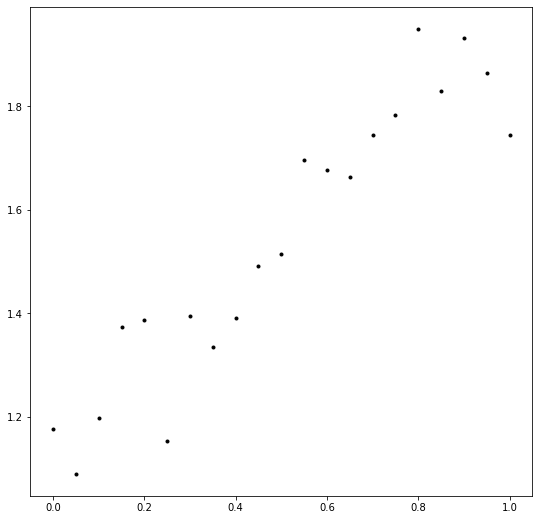

In [20]:
# Create constantly-spaced x-values
x = np.linspace(0,1,21)

# Create a linear function of $x$ with slope 1, intercept 1, and normally distributed error with sd=1
y = x + np.random.randn(len(x))*0.1 + 1.0
plt.plot(x,y,'k.')
plt.show()

In [21]:
# Create an initial guess for the weights
w = np.array([0.,0.])

# Define cost function (sum square error between prediction and data points)
def L(w,x,y):
    return 1./2.*sum((y - w[0] - w[1]*x)**2)

# Gradient function
def G(w,x,y):
    return np.array([-sum(y - w[0] - w[1]*x),-sum((y - w[0] - w[1]*x)*x)])

# Initialize weights
w = np.array([0.,0.])

# Initialize arrays to hold weights
w_stoch = [w.copy()]
w_epoch = [w.copy()]

# Define learning rates
eta = 0.01

# Train for 10000 epochs
for i in range(10000):
    
    # Draw random indices of the dataset
    random_indices = np.random.choice(range(len(x)),len(x),replace=False)
    
    # Loop over all of the data points without replacement
    for j in random_indices:
        
        # Take as a sample the j-th element in the training data
        x_sample = x[j]
        y_sample = y[j]
        
        # Take a gradient descent step based on that single data point
        w -= eta*G(w,np.array([x_sample]),np.array([y_sample]))
        w_stoch.append(w.copy())
    
    # Store the weights at the end of the epoch
    w_epoch.append(w.copy())

# Convert lists to arrays
w_stoch = np.array(w_stoch)
w_epoch = np.array(w_epoch)

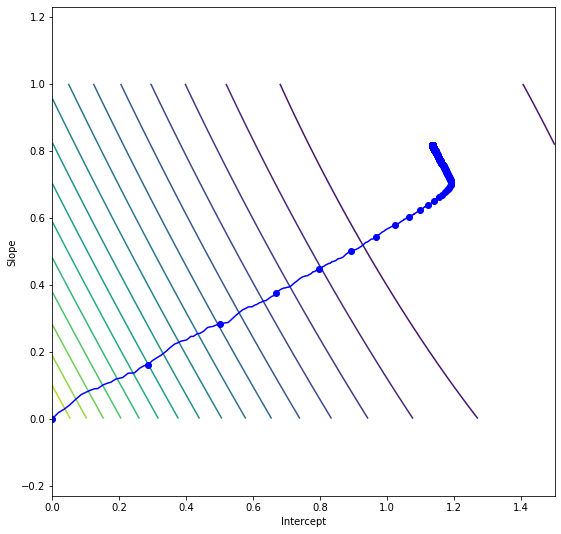

In [22]:
# Evaluate the cost function at many values of slope and intercept, aka the brute force method
L_grid = np.zeros((101,101))
w0s = np.linspace(0,1.5,101)
w1s = np.linspace(0,1,101)
for i,w1 in enumerate(w1s):
    for j,w0 in enumerate(w0s):
        L_grid[i,j] = L([w0,w1],x,y)

# Plot the error surface
plt.contour(w0s,w1s,L_grid,20)

# Plot the results of stochastic gradient descent in blue
plt.plot(w_stoch[:,0],w_stoch[:,1],'b-')
plt.plot(w_epoch[:,0],w_epoch[:,1],'bo')

plt.axis('equal')
plt.xlabel('Intercept')
plt.ylabel('Slope')
plt.show()


## Question 1:

Why is mini batch gradient descent considered a stochastic optimization? We are optimizing the same function after all. What part of the procedure causes the stochasticity? 


---

# 2.3 Momentum

A few issues that can arise when using SGD in machine leaning problems:

- Mini batches may have dramatic shifts in gradient due to sampling. We need to smooth that out somehow.
- Gradient decent may spend an annoyingly large amount of time "pinging off walls".
- There may be large places where our error boundary is essentially flat.

The idea with momentum is that we want to essentially modulate the step size based on some measurement of the gradient. For momentum we will use a running average of the first moment of the gradient. 

Incorporating this requires a small change to or generalized $G$ by replacing it with $m_t$. Instead of just using the gradient, we keep a running average of the gradient.  We also introduce another hyper parameter $\beta_1$ 

$$m_{t}=\beta_{1} m_{t-1} + (1 - \beta_{1})\nabla f(\theta_{t-1})$$
---

$$ \beta_1 \in [0,1)$$
---

$$\theta_{t}=\theta_{t-1} - \alpha m_{t} \tag{3}$$
---

## Question 2:

What are hyperparameters in this context? What are they at this point?

---

Notice that we could expand out that $m_{t-1}$ for $g_t = \nabla f(\theta_{t})$.

$$ m_{t} = (1-\beta_{1})g_{t} + \beta _{1}(1-\beta_{1})g_{t-1} + \beta _{1}^2 m_{t-2}$$
---

$$...$$
---

$$m_{t} = (1-\beta_{1})g_{t} + \beta _{1}(1-\beta_{1})g_{t-1} + ... + (1-\beta_{1})\beta _{1}^{t}g_{0}$$
---

We know from the geometric series that

$$ \frac{1}{1-\beta_{1}} = \sum_{k=0}^{\infty} \beta_{1}^{k} \textrm{ for } |\beta_{1}| < 1$$
---

So the form in the paper makes an exponentially decaying moving average (it's bounded under 1).

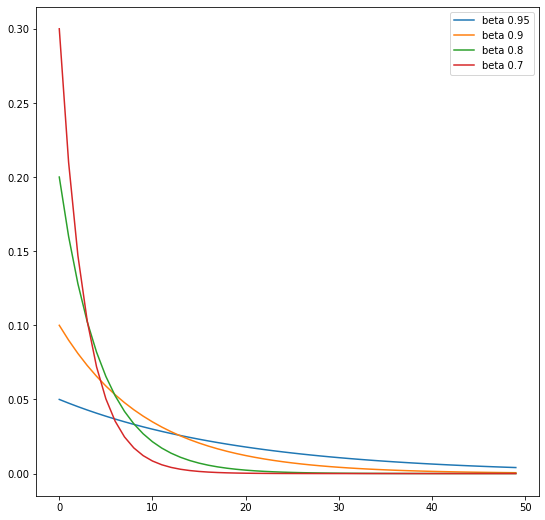

In [23]:
def beta_at_t(beta, n):
    return (1 - beta) * beta**n

for beta in [.95, .9, .8, .7]:
    plt.plot(list(range(50)), list(map(lambda i : beta_at_t(beta, i), range(50))), label=f'beta {beta}')

plt.legend()
plt.show()

## Question 3:

Why is $\beta_1$ utilized in this way with $\beta_1$ and $(1 - \beta_1)$ as coefficients of $m_{t-1}$ and $f(\theta_{t-1})$ respectively?

---

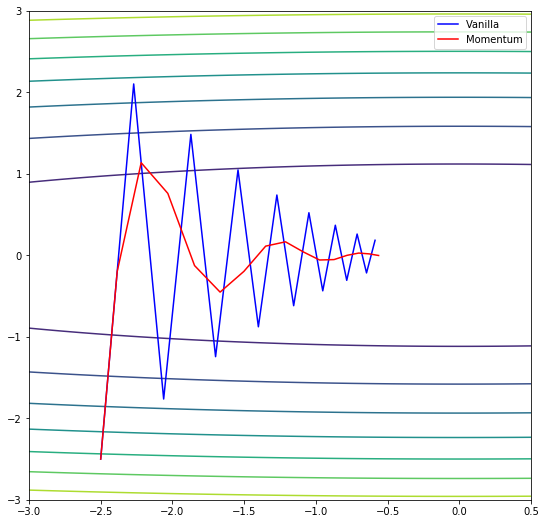

In [24]:
# initial guess
w_m = np.array([-2.5,-2.5])
# Create ws_m for trace
ws_m = [w_m.copy()]
eta = 0.23
z = 0
b = .5
# Gradient decent
for i in range(15):
    g = grad_f(w_m[0],w_m[1])
    z = b*z + (1-b)*g
    w_m -= eta * z
    ws_m.append(w_m.copy())

ws_m = np.array(ws_m)
    
plt.contour(X,Y,Z)
plt.plot(ws[:,0],ws[:,1],'b-', label='Vanilla')
plt.plot(ws_m[:,0],ws_m[:,1],'r-', label='Momentum')
plt.legend()

For a excellent but very mathy explanation of why this is https://distill.pub/2017/momentum/

### Rosenbrock banana

To Demonstrate the "flat bit" problem consider the Rosenbrock banana function $f(x,y)=(a-x)^2 + b(y-x^2)^2$ (typical choice for parameters is $a=1$,$b=100$) a famously hard to optimize problem.

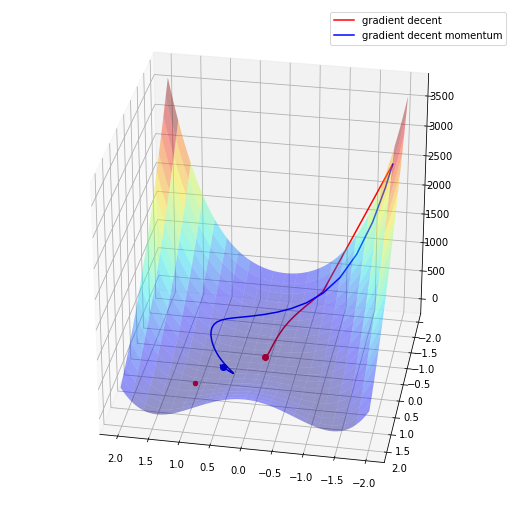

In [25]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import animation
from IPython.display import HTML

matplotlib.rcParams['animation.embed_limit'] = 2**128

# Rosenbrock Parameters
a = 1
b = 100
def rosenbrock(x, y):
    """
    The Rosenbrock banana function
    """
    return (a - x)**2 + b * (y - x**2)**2

def gradient_rosenbrock(w):
    """
    The Gradient of Rosenbrock function
    """
    x = w[0]
    y = w[1]
    return np.array([-2*a + 4*b*x**3 - 4*b*x*y + 2*x, 2*b*(y-x**2)])

#Setup of meshgrid of w values
T1, T2 = np.meshgrid(np.linspace(-2,2,100),np.linspace(-2,2,100))

Z = rosenbrock(T1, T2)

fig = plt.figure(figsize = (7,7))
ax = Axes3D(fig)

#Create surface plot of rosenbrock function
ax.scatter3D([1], [1], [rosenbrock(1,1)], c='r', zorder=100)
ax.plot_surface(T1, T2, Z, rstride = 5, cstride = 5, cmap = 'jet', alpha=.4, zorder=0)
ax.view_init(30, 100)

# storage for gradient decent path
gd_w0s = []
gd_w1s = []
gd_loss = []

# storage for gradient decent with momentum path
gd_m_w0s = []
gd_m_w1s = []
gd_m_loss = []

# leanring rate
eta = 0.0003

# Define momentum parameter
momentum = 0.9

# Define a variable to hold the update step from the previous time step
delta_w = 0.0

# initial ws
start = np.array([-1.8,-1.8])
w_gd = start.copy()
w_gd_m = start.copy()
for i in range(100):
    # regular gradient decent
    gd_w0s.append(w_gd[0])
    gd_w1s.append(w_gd[1])
    gd_loss.append(rosenbrock(w_gd[0],w_gd[1]))

    w_gd -= eta * gradient_rosenbrock(w_gd)
        
    # gradient decent with momentum  
    gd_m_w0s.append(w_gd_m[0])
    gd_m_w1s.append(w_gd_m[1])
    gd_m_loss.append(rosenbrock(w_gd_m[0],w_gd_m[1]))
    
    # Compute the update direction (no longer just the gradient: now a weighted average of the
    # gradient with previous gradients)
    delta_w = momentum*delta_w + (1.-momentum)*gradient_rosenbrock(w_gd_m)
        
    # Update weights
    w_gd_m -= eta*delta_w

def create_update_functions(w0s, w1s, loss, ax, color, name: str):
    line, = ax.plot([], [], [], f'{color}-', label = name, lw = 1.5)
    point, = ax.plot([], [], [], 'o', color = color)
    
    def init():
        line.set_data([], [])
        line.set_3d_properties([])
        point.set_data([], [])
        point.set_3d_properties([])
        

        return line, point
        
    def animate(i):
        # Animate line
        line.set_data(w0s[:i+1], w1s[:i+1])
        line.set_3d_properties(loss[:i+1])
    
        # Animate points
        point.set_data(w0s[i], w1s[i])
        point.set_3d_properties(loss[i])
        
        return line, point
    
    return line, point, init, animate
    
line_gd, point_gd, init_gd, animate_gd = create_update_functions(
        gd_w0s, gd_w1s, gd_loss, ax, 'r', 'gradient decent')
    
line_gd_m, point_gd_m, init_gd_m, animate_gd_m = create_update_functions(
    gd_m_w0s, gd_m_w1s, gd_m_loss, ax, 'b', 'gradient decent momentum')

def init():
    init_gd()
    init_gd_m()
    
    return line_gd, point_gd, line_gd_m, point_gd_m

def animate(i):
    animate_gd(i)
    animate_gd_m(i)
    
    return line_gd, point_gd, line_gd_m, point_gd_m


ax.legend(loc = 1)

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=100, interval=120, 
                               repeat_delay=60, blit=True)

HTML(anim.to_jshtml())

# 2.4 RMSProp

This is great! We appear to be getting closer to the optima with a smoother path. Can we do any better? Sure! 

Keeping a moving average of the first moment of the gradient is great but what about a moving average of the variance? In the Adam paper, they refer to this as the moving average of the second moment. 

RMSProp (Tieleman & Hinton, 2012) is a method that utilizes a moving average of the second moment. This also requires a small update to our generalized $G$ to bring our update rule to its new form. $\epsilon$ is the very small number to prevent division by $0$.

$$v_{t} = \beta_{2}v_{t-1} + (1 - \beta_{2})\nabla f(\theta_{t-1})^2$$
---

$$ \beta_2 \in [0,1)$$
---

$$\theta_{t} = \theta_{t-1} - \alpha \frac { \nabla f(\theta_{t-1})}{\sqrt{v_{t} + \epsilon}} \tag{4}$$ 
---


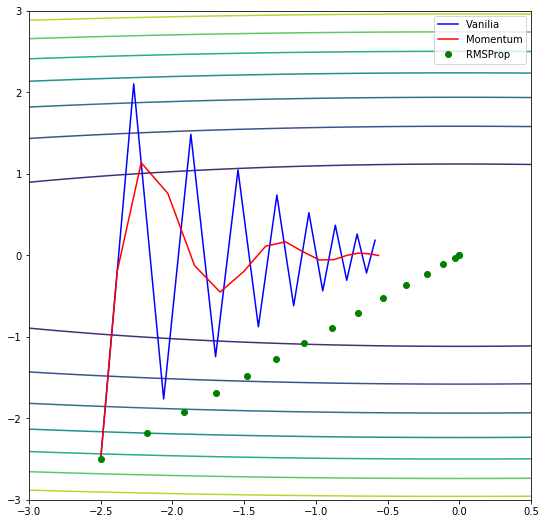

In [26]:
# Stuff for plotting
x = np.linspace(-3,.5,250)
y = np.linspace(-3,3,250)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# initial guess
w_rms = np.array([-2.5,-2.5])
# Create ws_m for trace
ws_rms = [w_rms.copy()]
eta = 0.23
v = 0
b_2 = 0.5
epsilon = 0.0000000000000001

# Gradient decent
for i in range(15):
    g = grad_f(w_rms[0],w_rms[1])

    v = b_2*v + (1-b_2)*(g*g)
    w_rms -= eta / np.sqrt(v + epsilon) * g
    ws_rms.append(w_rms.copy())

ws_rms = np.array(ws_rms)
    
plt.contour(X,Y,Z)
plt.plot(ws[:,0],ws[:,1],'b-', label='Vanilia')
plt.plot(ws_m[:,0],ws_m[:,1],'r-', label='Momentum')
plt.plot(ws_rms[:,0], ws_rms[:,1], 'go', label='RMSProp')
plt.legend()

## Question 4:

This is the first method we have seen that is invariant to the re-scaling of the gradient. Why is this method invariant to the re-scaling of the gradient? 

---

# 2.5 Adam

Wow! RMSProp seems to do really great. Momentum seems pretty cool too. Is there a way to combine the two? Sure there is, its called Adam which derives its name from adaptive moment estimation.

How is Adam different. In short, it utilized both a moving average of both the first and second moments with initialization bias correction. 

Our generalized $G$ changes to incorporate these changes. First we have the running average of the first and second moments:

$$m_{t}=\beta_{1} m_{t-1} + (1 - \beta_{1})\nabla f(\theta_{t-1})$$
---

$$v_{t} = \beta_{2}v_{t-1} + (1 - \beta_{2})\nabla f(\theta_{t-1})^2$$
---

Next we incorporate initialization bias corrections:

$$\hat m_{t} = \frac {m_{t}}{1 - \beta_1^{t}}$$
---

$$\hat v_t = \frac {v_{t}}{1 - \beta_2^{t}}$$
---

Last we use the bias corrected first and second moments to update our parameters $\theta_t$

$$\theta_t = \theta_{t-1} - \alpha \frac {\hat m_t}{\sqrt{\hat v_t + \epsilon}} \tag{5}$$
---

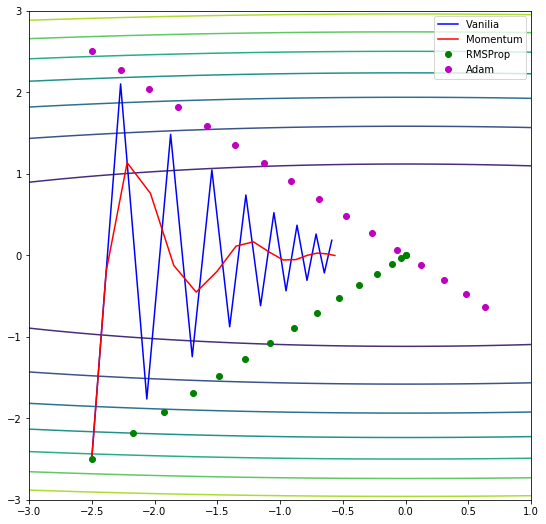

In [27]:
# Stuff for plotting
x = np.linspace(-3,1,250)
y = np.linspace(-3,3,250)
X, Y = np.meshgrid(x, y)
Z = f(X, Y)

# initial guess
w_adam = np.array([-2.5,2.5])
# Create ws_m for trace
ws_adam = [w_adam.copy()]
eta = 0.23
m = 0
v = 0
b_1 = 0.99
b_2 = 0.999
epsilon = 0.0000000000000001

# Gradient decent
for i in range(15):
    # gradient, first and second moment estimations
    g = grad_f(w_adam[0],w_adam[1])
    m = b_1*m + (1-b_1)*g
    v = b_2*v + (1-b_2)*(g*g)

    # bias correction
    m_hat = m / (1 - np.power(b_1, i + 1))
    v_hat = v / (1 - np.power(b_2, i + 1))
    
    # update parameters
    w_adam -= eta / np.sqrt(v_hat + epsilon) * m_hat
    ws_adam.append(w_adam.copy())

ws_adam = np.array(ws_adam)
    
plt.contour(X,Y,Z)
plt.plot(ws[:,0],ws[:,1],'b-', label='Vanilia')
plt.plot(ws_m[:,0],ws_m[:,1],'r-', label='Momentum')
plt.plot(ws_rms[:,0], ws_rms[:,1], 'go', label='RMSProp')
plt.plot(ws_adam[:,0], ws_adam[:,1], 'mo', label='Adam')
plt.legend()

## Question 5:

What is a possible reason that Adam is initially overshooting the optima?

---

## Bias Correction

One important difference between Adam and other optimizations is the initialization bias correction. This occurs after calculating the estimated first and second moments of the gradient. For discussion we will only show the first moment and its correction because the reasoning applies to the estimate of the second moment as well. 

$$m_{t}=\beta_{1} m_{t-1} + (1 - \beta_{1})\nabla f(\theta_{t-1})$$
---

$$\hat m_{t} = \frac {m_{t}}{1 - \beta_1^{t}}$$
---

We need to make this bias correction because we initialize our all of our first moment estimate to $m_0 = 0$ for the first step. This leads to moment estimates that are biased to $0$. This can be easily seen when we calculate $\hat m$ at the first time step with $t=1$

$$m_0 = 0 , t=1$$
--

$$m_{t}=\beta_{1} \cdot 0 + (1 - \beta_{1})\nabla f(\theta_{0})$$
---

$$\hat m_1 = \frac {(1 - \beta_{1})\nabla f(\theta_{0})}{(1 - \beta_1^1)}$$
---

$$\hat m_1 = \nabla f(\theta_{0})$$
---

What happens if we don't use the bias correction?

$$m_0 = 0, t=1, \beta_1 = 0.9$$
--

$$m_{t}=\beta_{1} \cdot 0 + (1 - \beta_{1})\nabla f(\theta_{0})$$
---

$$m_t = 0.1 \cdot \nabla f(\theta_{0})$$
---

Therefore, with no bias correction our moving estimate of the first moment will bias towards $0$.

Importantly, the influence of the bias correction diminishes as $t \to \infty $ 
Remember that $ \beta_1 \in [0,1)$

$$\lim\limits_{t \to \infty} (1 - \beta_1^t) = 1$$
---

$$ \hat m_t = \frac{m_t}{1}$$
---

$$ \hat m_t = m_t$$
---

## Question 6

Why do we keep referring to $m_t$ and $v_t$ as estimates of the first and second moment? 

---

# Discussion Questions

1. Regular stochastic gradient decent (with some momentum) often finds results with better test set accuracy than Adam. Why?
1. We have fancier optimization methods that use second derivatives why might we not want to use one of those?
1. What happens with a saddle?